# Apple Mobility Trends

*Bob Peers - April 2020*

This is analysis based on the Apple Mobility Trends Reports (https://www.apple.com/covid19/mobility)



In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import dates as mdates
from matplotlib import ticker

%config InlineBackend.figure_format = 'retina'
colors = ['#E55934','#9BC53D','#5BC0EB']

This is the latest data from April 14th, you need to update this link as new data is publlished by Apple

In [2]:
file_link = 'https://covid19-static.cdn-apple.com/covid19-mobility-data/2005HotfixDev14/v1/en-us/applemobilitytrends-2020-04-14.csv'
df = pd.read_csv(file_link, index_col=False)

In [3]:
df

,geo_type,region,transportation_type,2020-01-13,2020-01-14,2020-01-15,2020-01-16,2020-01-17,2020-01-18,2020-01-19,...,2020-04-05,2020-04-06,2020-04-07,2020-04-08,2020-04-09,2020-04-10,2020-04-11,2020-04-12,2020-04-13,2020-04-14
0,country/region,Albania,driving,100,95.30,101.43,97.20,103.55,112.67,104.83,...,22.54,26.40,26.03,26.43,26.70,26.32,25.47,24.89,32.64,31.43
1,country/region,Albania,walking,100,100.68,98.93,98.46,100.85,100.13,82.13,...,23.92,31.13,25.80,29.81,28.96,27.29,27.63,29.59,35.52,38.08
2,country/region,Argentina,driving,100,97.07,102.45,111.21,118.45,124.01,95.44,...,11.53,17.24,18.55,19.95,19.80,16.80,19.40,12.89,21.10,22.29
3,country/region,Argentina,walking,100,95.11,101.37,112.67,116.72,114.14,84.54,...,9.12,11.85,13.49,15.51,14.65,13.58,15.75,10.45,16.35,16.66
4,country/region,Australia,driving,100,102.98,104.21,108.63,109.08,89.00,99.35,...,51.75,53.17,55.01,59.24,33.19,36.00,26.95,31.72,53.14,55.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,city,Washington DC,transit,100,100.78,103.92,105.02,112.26,96.01,87.76,...,15.54,18.87,17.59,18.79,16.92,17.76,16.99,14.23,17.01,17.37
391,city,Washington DC,walking,100,99.07,109.61,104.16,123.16,119.71,106.28,...,40.96,40.76,35.97,43.18,36.12,37.50,44.63,32.84,33.58,37.56
392,city,Zurich,driving,100,102.38,110.84,105.48,113.83,109.67,102.03,...,60.78,65.57,69.43,71.98,69.31,61.38,63.78,54.97,67.09,72.52
393,city,Zurich,transit,100,101.51,108.93,97.87,103.91,98.50,93.83,...,28.69,29.56,31.39,32.01,31.32,31.35,29.18,31.49,32.90,35.71


Data is in wide format so we need to melt the data into a vertical format

In [4]:
df = pd.melt(df, id_vars=['geo_type','region', 'transportation_type'],var_name='Date')

In [5]:
df.rename(columns={'value':'Data'}, inplace=True)
df['Date'] = df['Date'].astype('datetime64[ns]')
df['Index'] = df['Data'].astype('float')

Transportation type are in rows but we'd like the as separate columns so we pivot the data

In [6]:
df = df.pivot_table( index=['Date','geo_type','region'], values=['Data'], columns=['transportation_type'])
df = df.reset_index()
#df_cphp.rename(columns={0:'Data'}, inplace=True)

In [7]:
df

Date        geo_type                region    Data  \
transportation_type                                                  driving   
0                   2020-01-13            city             Amsterdam  100.00   
1                   2020-01-13            city                Athens  100.00   
2                   2020-01-13            city               Atlanta  100.00   
3                   2020-01-13            city              Auckland  100.00   
4                   2020-01-13            city             Baltimore  100.00   
...                        ...             ...                   ...     ...   
14131               2020-04-14  country/region               Ukraine   65.56   
14132               2020-04-14  country/region  United Arab Emirates   42.46   
14133               2020-04-14  country/region         United States   59.30   
14134               2020-04-14  country/region               Uruguay   28.74   
14135               2020-04-14  country/region               Vietnam   48.57   

                                     
transportation_type transit walking  
0                    100.00  100.00  
1                       NaN  100.00  
2                    100.00  100.00  
3                    100.00  100.00  
4                    100.00  100.00  
...                     ...     ...  
14131                   NaN   47.76  
14132                   NaN   48.32  
14133                 24.44   48.68  
14134                   NaN   19.77  
14135                   NaN   48.82  

[14136 rows x 6 columns]

Lowest __driving__ index value

In [17]:
df[df[('Data','driving')] == df[('Data','driving')].min()]

Date geo_type     region    Data                
transportation_type                                driving transit walking
11416               2020-03-28     city  Cape Town    7.52     NaN    8.48

Lowest __walking__ index value

In [18]:
df[df[('Data','walking')] == df[('Data','walking')].min()]

Date geo_type     region    Data                
transportation_type                                driving transit walking
12622               2020-04-05     city  Barcelona     8.7    8.23    3.78

Lowest __transit__ index value

In [19]:
df[df[('Data','transit')] == df[('Data','transit')].min()]

Date geo_type region    Data                
transportation_type                            driving transit walking
11314               2020-03-27     city   Rome    12.9    4.11    6.32

Get all locations and plot a few as a check on our data

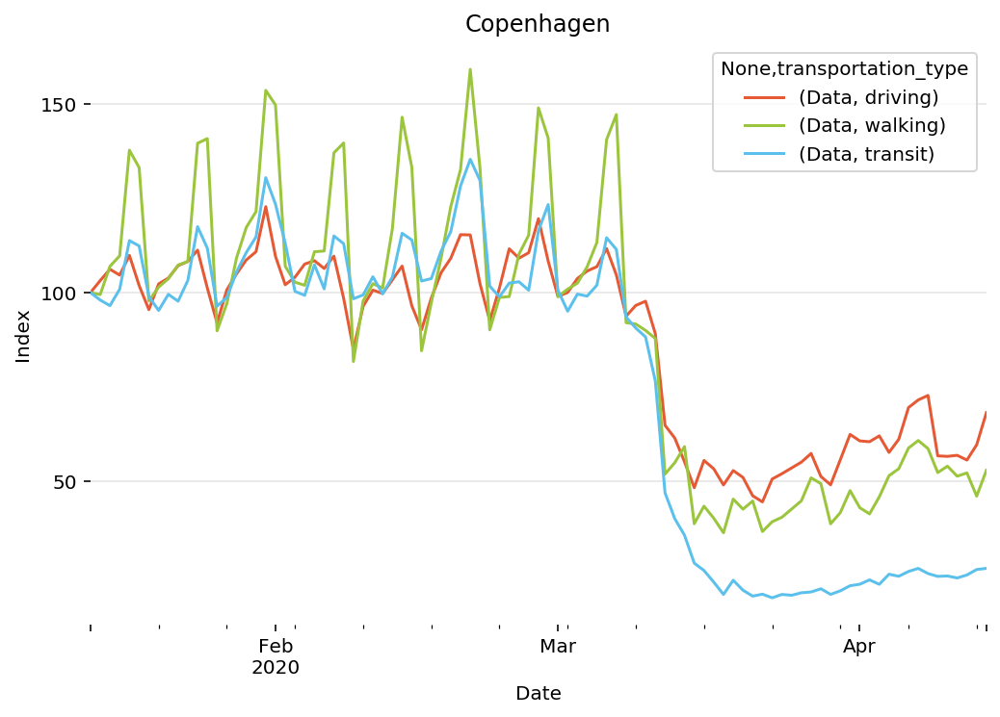

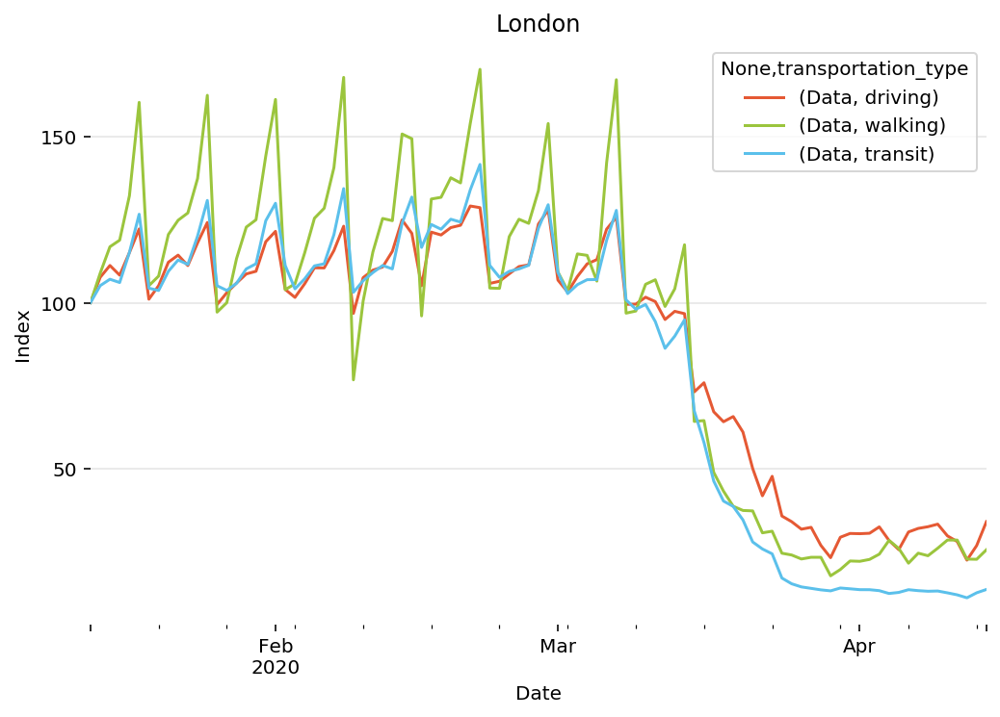

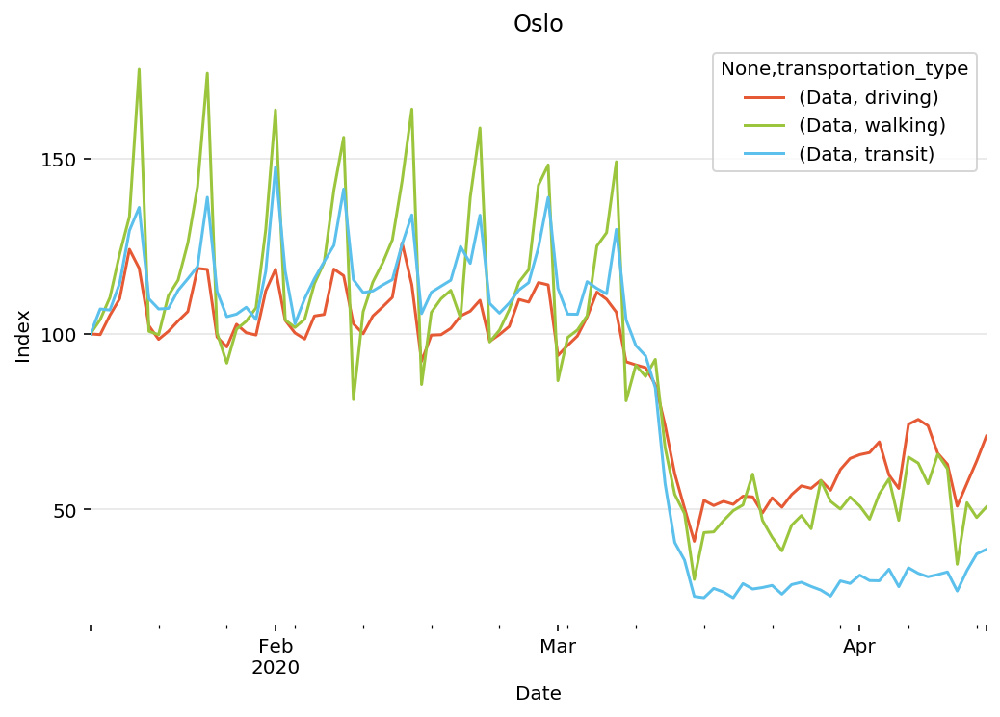

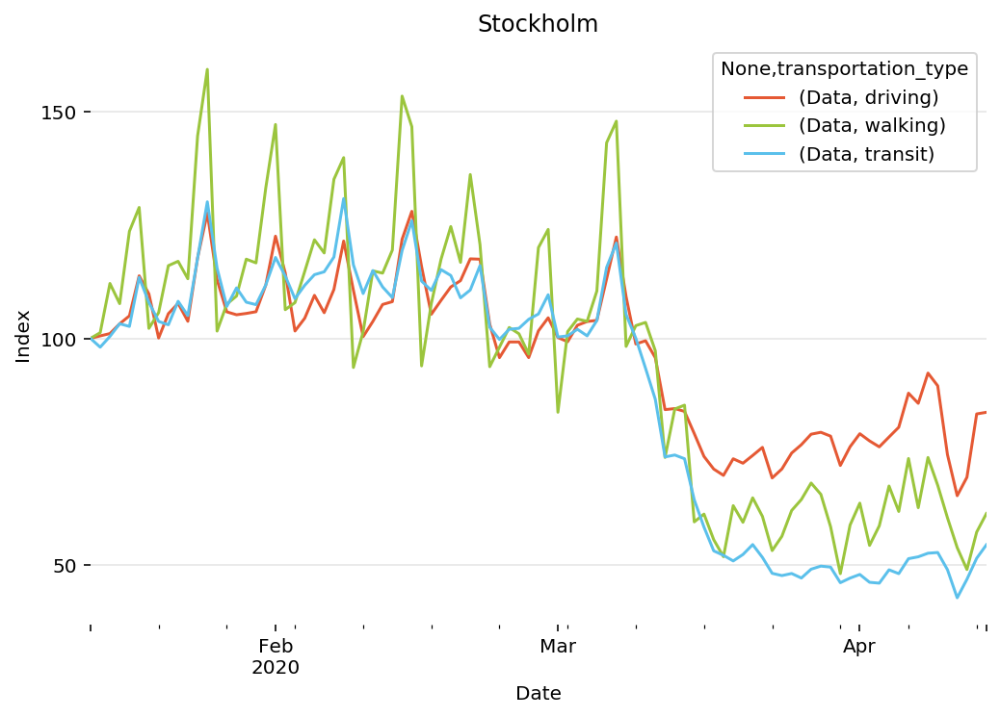

In [25]:
locs = df.region.unique().tolist()
gen = (c for c in locs if c in ['Copenhagen','Stockholm','Oslo','London'])
for c in gen:
    df_c = df[df.region==c]
    ax = df_c.plot(kind='line',x='Date',y=[('Data','driving'),('Data','walking'),('Data','transit')],color=colors, legend='transportation_type', title=df_c.region.iloc[0],figsize=(600/72, 400/72))
    #ax.set_title(region)
    ax.set_ylabel('Index')
    ax.yaxis.set_major_locator(ticker.MultipleLocator(50))

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)

Create a function to create our subplots, one per city or region

In [189]:
def plot_mob(locations):
    # get date rabgle for reference line
    mindate,maxdate = (df.Date.min(), df.Date.max())

    # setup subplots
    ncols = 4
    nrows = int(np.ceil(len(locations) / ncols))

    # We can ask for ALL THE AXES and put them into axes
    fig, axes = plt.subplots(nrows, ncols, sharex=True, sharey=True, figsize=(15, nrows*5))
    axes_list = [item for sublist in axes for item in sublist] 

    # create subplots for each city in ciites list
    for region, selection in df[df.region.isin(locations)].groupby("region"):
        ax = axes_list.pop(0)
        selection.plot(linewidth=1, x='Date', y=[('Data','driving'),('Data','walking'),('Data','transit')], color=colors, ax=ax, legend=False)
        ax.plot([mindate, maxdate],[100,100], linewidth=2, color='#cccccc', zorder=-2)
        ax.set_title(region)
        ax.set_ylabel('Index')
        ax.yaxis.set_major_locator(ticker.MultipleLocator(50))

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.grid(which='major', axis='y', c='k', alpha=.1, zorder=-2)

    # Now use the matplotlib .remove() method to 
    # delete anything we didn't use
    for ax in axes_list:
        ax.remove()

    plt.tight_layout()
    plt.legend()
    fig.set_facecolor('w')

## Plot all the cities
List all the cities in the dataset

In [181]:
cities = df[df.geo_type=='city'].region.unique().tolist()
print(*cities)

Amsterdam Athens Atlanta Auckland Baltimore Bangkok Barcelona Berlin Birmingham - UK Bochum - Dortmund Boston Brisbane Brussels Buenos Aires Cairo Calgary Cape Town Chicago Cologne Copenhagen Dallas Delhi Denver Detroit Dubai Dublin Dusseldorf Edmonton Frankfurt Fukuoka Guadalajara Halifax Hamburg Helsinki Houston Hsin-chu Istanbul Jakarta Johannesburg Kuala Lumpur Leeds Lille London Los Angeles Lyon Madrid Manchester Manila Melbourne Mexico City Miami Milan Montreal Moscow Mumbai Munich Nagoya New York City Osaka Oslo Ottawa Paris Perth Philadelphia Rio de Janeiro Riyadh Rome Rotterdam Saint Petersburg San Francisco - Bay Area Santiago Sao Paulo Seattle Seoul Stockholm Stuttgart Sydney Taichung Taipei Tel Aviv Tijuana Tokyo Toronto Toulouse Utrecht Vancouver Vienna Washington DC Zurich


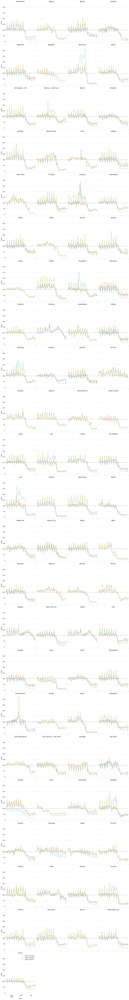

In [191]:
plot_mob(cities)

## Plot all regions
List all regions in the dataset

In [182]:
regions = df[df.geo_type=='country/region'].region.unique().tolist()
print(*regions)

Albania Argentina Australia Austria Belgium Brazil Bulgaria Cambodia Canada Chile Colombia Croatia Czech Republic Denmark Egypt Estonia Finland France Germany Greece Hong Kong Hungary Iceland India Indonesia Ireland Israel Italy Japan Latvia Lithuania Luxembourg Macao Malaysia Mexico Morocco Netherlands New Zealand Norway Philippines Poland Portugal Republic of Korea Romania Russia Saudi Arabia Serbia Singapore Slovakia Slovenia South Africa Spain Sweden Switzerland Taiwan Thailand Turkey UK Ukraine United Arab Emirates United States Uruguay Vietnam


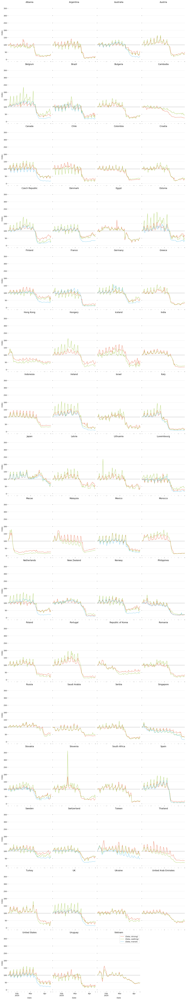

In [192]:
plot_mob(regions)

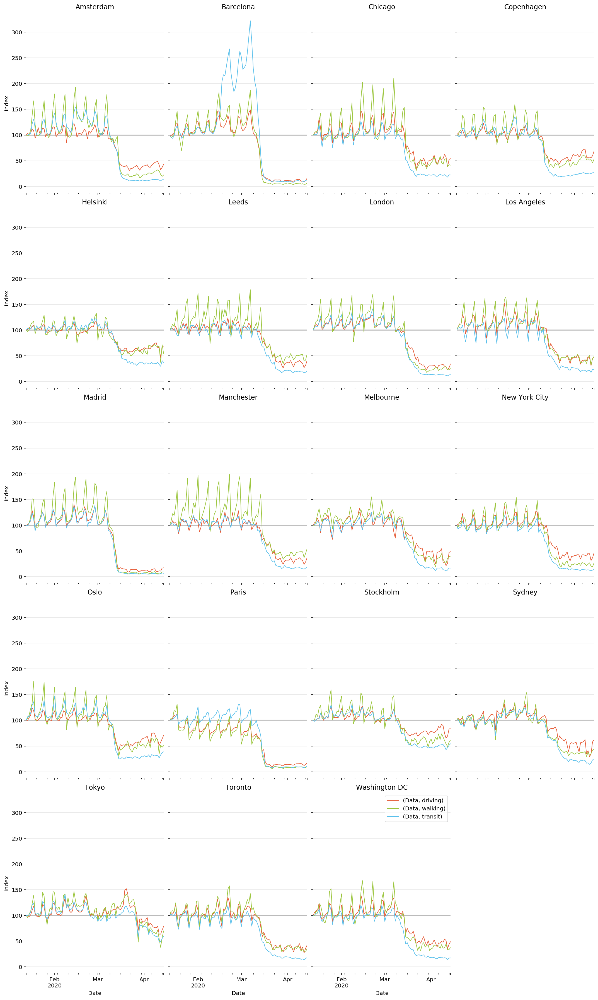

In [190]:
sample_cities = ['Amsterdam','Barcelona','Chicago','Copenhagen','Helsinki','Leeds','London','Los Angeles','Madrid','Manchester','Melbourne' ,'New York City','Oslo','Paris','Stockholm','Sydney','Tokyo','Toronto','Washington DC']
plot_mob(sample_cities)